In [ ]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics
from yellowbrick.cluster import KElbowVisualizer

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df=pd.read_csv("bank-full(structured).csv")
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [ ]:
X = df.drop('y', axis=1)
Y = df['y']

In [ ]:
df = df.iloc[:,:6]
df.drop("default", axis=1,inplace=True)
df = df[df['balance'] > 0]
df

,age,job,marital,education,balance
0,58,management,married,tertiary,2143
1,44,technician,single,secondary,29
2,33,entrepreneur,married,secondary,2
3,47,blue-collar,married,unknown,1506
4,33,unknown,single,unknown,1
...,...,...,...,...,...
45206,51,technician,married,tertiary,825
45207,71,retired,divorced,primary,1729
45208,72,retired,married,secondary,5715
45209,57,blue-collar,married,secondary,668


In [ ]:
df.duplicated().sum()

2932

In [ ]:
df = df.drop_duplicates()

In [ ]:
df.isna().sum()

age          0
job          0
marital      0
education    0
balance      0
dtype: int64

In [ ]:
s = (df.dtypes == 'object')
object_cols = list(s[s].index)

print("Categorical variables in the dataset:", object_cols)

Categorical variables in the dataset: ['job', 'marital', 'education']


In [ ]:
cont_features = []
cat_features = []

for c in df.columns:
    if df[c].dtype == 'int64':
        cont_features += [c]
    else:
        cat_features += [c]

In [ ]:
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
OH_cols = pd.DataFrame(OH_encoder.fit_transform(df[cat_features]))
OH_cols.index = df.index

df_cont = df.drop(cat_features, axis=1)

df_OH = pd.concat([df_cont, OH_cols], axis=1)

In [ ]:
import plotly.graph_objs as go

fig = go.Figure()

# Add first subplot
fig.add_trace(go.Histogram(x=df_OH['age'], nbinsx=30))

# Add second subplot
fig.add_trace(go.Histogram(x=df_OH['balance'], nbinsx=30))

# Update layout
fig.update_layout(
    title='Distribution of Age and Balance',
    xaxis=dict(title='Value'),
    yaxis=dict(title='Frequency'),
    barmode='overlay',
    bargap=0.1,
    bargroupgap=0.1,
    showlegend=False,
    height=800,
    width=800
)

fig.show()


In [ ]:
import plotly.graph_objs as go

# Log-transform and standardize the continuous features in df_OH
df_OH[cont_features] = np.log(df_OH[cont_features])
scaler = StandardScaler()
df_OH[cont_features] = scaler.fit_transform(df_OH[cont_features])

# Standardize the continuous features in df
df[cont_features] = scaler.fit_transform(df[cont_features])

# Create the Plotly figure
fig = go.Figure()

# Add first subplot for df_OH['age']
fig.add_trace(go.Histogram(x=df_OH['age'], nbinsx=30))

# Add second subplot for df_OH['balance']
fig.add_trace(go.Histogram(x=df_OH['balance'], nbinsx=30))

# Update layout
fig.update_layout(
    title='Distribution of Age and Balance (Log-transformed and Standardized)',
    xaxis=dict(title='Value'),
    yaxis=dict(title='Frequency'),
    barmode='overlay',
    bargap=0.1,
    bargroupgap=0.1,
    showlegend=False,
    height=800,
    width=800
)

fig.show()


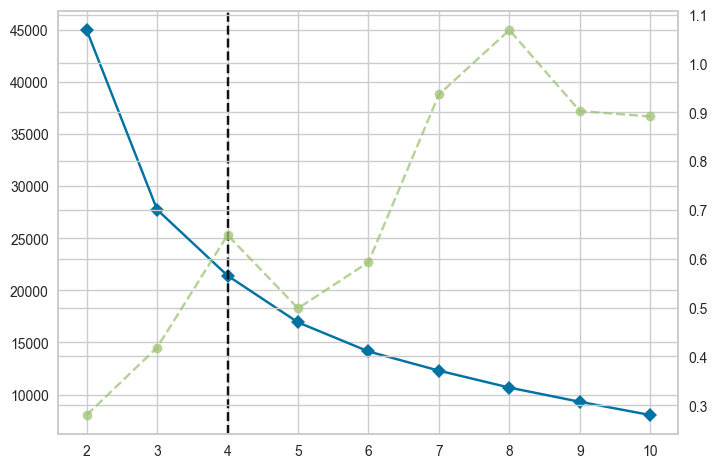

In [ ]:
import plotly.graph_objs as go
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the KElbowVisualizer with KMeans clustering and k=10
Elbow_M = KElbowVisualizer(KMeans(), k=10)

# Fit the visualizer to the data
Elbow_M.fit(df[cont_features])

# Extract the scores and add them to a Plotly trace
scores = [(i, score) for i, score in enumerate(Elbow_M.k_scores_[1:], start=2)]
trace = go.Scatter(x=[i for i, score in scores], y=[score for i, score in scores],
                   mode='lines+markers', name='Elbow Curve')

# Create the Plotly figure
fig = go.Figure(data=[trace])

# Update layout
fig.update_layout(title='Elbow Curve for KMeans Clustering',
                  xaxis=dict(title='Number of Clusters (k)'),
                  yaxis=dict(title='Distortion Score'),
                  height=600,
                  width=800)

fig.show()


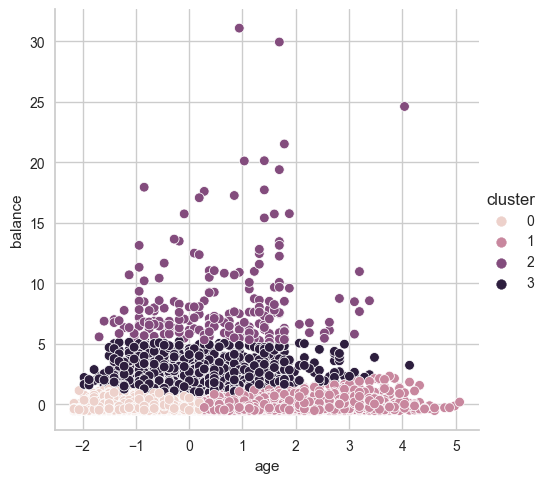

In [ ]:
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=0, n_init=30, max_iter=100)
clusters = kmeans.fit_predict(df[cont_features])
df['cluster'] = clusters
sns.relplot(x='age', y='balance', hue='cluster', data=df)

In [ ]:
df=pd.read_csv("bank-full(structured).csv")
df = df.iloc[:,:6]
df = df.drop(columns='default')
df = df[df['balance'] > 0]
df = df.drop_duplicates()
df['cluster'] = clusters
groups = df.groupby(['cluster']).agg(['min', 'median', 'mean', 'max', 'sum', 'count']).round()
groups['pct_total'] = (groups['balance']['sum'] / groups['balance']['sum'].sum()).round(3)*100
groups

age                                 balance                            \
        min median  mean max     sum  count     min   median     mean     max   
cluster                                                                         
0        18   34.0  34.0  43  687818  20277       1    500.0    890.0    5741   
1        43   51.0  52.0  95  637566  12154       1    688.0   1178.0    9224   
2        23   46.0  47.0  84    9555    205   18268  23919.0  28823.0  102127   
3        20   41.0  42.0  85   99525   2363    4094   7255.0   8157.0   18508   

                         pct_total  
              sum  count            
cluster                             
0        18049506  20277      31.4  
1        14314361  12154      24.9  
2         5908616    205      10.3  
3        19275849   2363      33.5

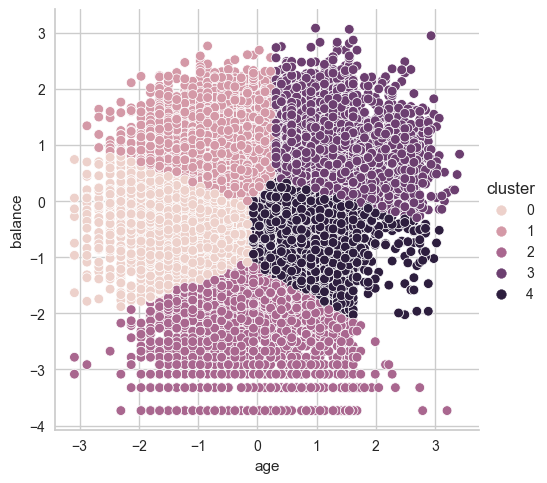

In [ ]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=0, n_init=30, max_iter=100)
clusters = kmeans.fit_predict(df_OH[cont_features])
df_OH['cluster'] = clusters
sns.relplot(x='age', y='balance', hue='cluster', data=df_OH)

In [ ]:
import plotly.express as px

kmeans = KMeans(n_clusters=5, init='k-means++', random_state=0, n_init=30, max_iter=100)
clusters = kmeans.fit_predict(df_OH[cont_features])
df_OH['cluster'] = clusters

fig = px.scatter(df_OH, x='age', y='balance', color='cluster')
fig.show()


In [ ]:
from sklearn.metrics import silhouette_score

# Fit KMeans clustering model with k=5
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=0, n_init=30, max_iter=100)
clusters = kmeans.fit_predict(df_OH[cont_features])
df_OH['cluster'] = clusters

# Calculate silhouette score
silhouette_avg = silhouette_score(df_OH[cont_features], df_OH['cluster'])

print(f"Silhouette score for KMeans clustering with k=5: {silhouette_avg:.4f}")


Silhouette score for KMeans clustering with k=5: 0.3387


In [ ]:
wcss = {'wcss_score':[], 'no_of_clusters':[]}
for i in range(1,11):
    kmeans = KMeans(i, random_state=0)
    kmeans.fit(df_OH[cont_features])
    wcss['wcss_score'].append(kmeans.inertia_)
    wcss['no_of_clusters'].append(i)
wcss_df = pd.DataFrame(wcss)

In [ ]:
wcss_df.head(10)

,wcss_score,no_of_clusters
0,69998.000000,1
1,44402.830666,2
2,29609.017743,3
3,23847.454054,4
4,19015.307118,5
5,16388.095354,6
6,14409.854043,7
7,12827.754864,8
8,11531.760422,9
9,10506.888092,10


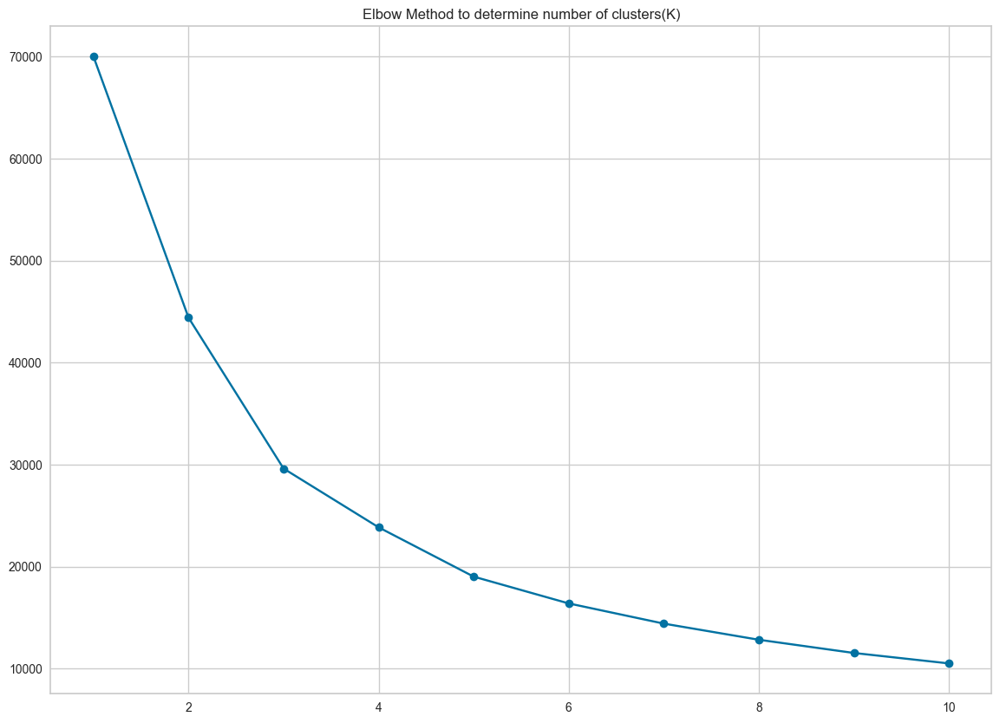

In [ ]:
plt.figure(figsize=(14,10))
plt.plot(wcss_df.no_of_clusters, wcss_df.wcss_score, marker='o')
plt.title("Elbow Method to determine number of clusters(K)")
plt.show()

In [ ]:
# Convert categorical variables to numerical using one-hot encoding
X = pd.get_dummies(X, columns=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome'])
X.head()

,age,balance,day,duration,campaign,pdays,previous,job_admin.,job_blue-collar,job_entrepreneur,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,2143,5,261,1,-1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
1,44,29,5,151,1,-1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
2,33,2,5,76,1,-1,0,0,0,1,...,0,0,1,0,0,0,0,0,0,1
3,47,1506,5,92,1,-1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,1
4,33,1,5,198,1,-1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1


In [ ]:
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
scaler = StandardScaler() 
scaled_df = scaler.fit_transform(X) 
  
# Normalizing the Data 
normalized_df = normalize(scaled_df) 
  
# Converting the numpy array into a pandas DataFrame 
normalized_df = pd.DataFrame(normalized_df) 
  
# Reducing the dimensions of the data 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(normalized_df) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head(2)

,P1,P2
0,0.273423,-0.379659
1,0.519132,0.022951


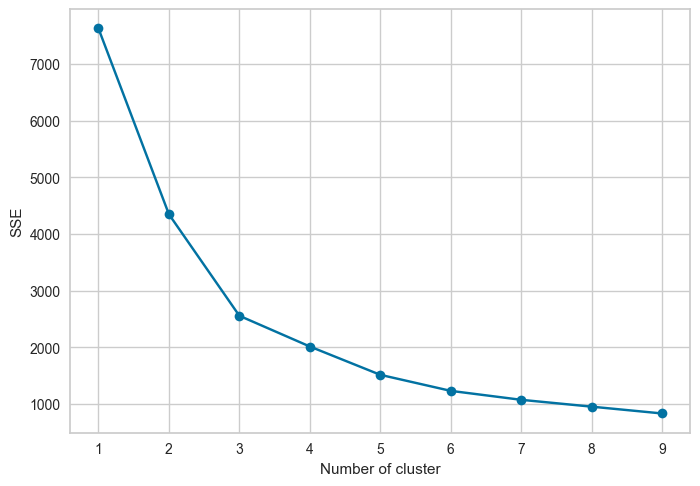

In [ ]:
sse = {} #sum of squeared  errors
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(X_principal)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()),marker='o')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.savefig("p2.png")
plt.show()

In [ ]:
# import plotly.graph_objs as go

# silhouette_scores = []

# for n_cluster in range(2, 10):
#     silhouette_scores.append(
#         silhouette_score(X_principal, KMeans(n_clusters=n_cluster).fit_predict(X_principal)))

# fig = go.Figure(go.Bar(x=[2, 3, 4, 5, 6, 7, 8, 9], y=silhouette_scores))
# fig.update_layout(title='Silhouette Scores for Different Numbers of Clusters',
#                   xaxis_title='Number of Clusters',
#                   yaxis_title='Silhouette Score')
# fig.show()


In [ ]:
# import plotly.graph_objs as go

# kmeans = KMeans(n_clusters=3)
# clusters = kmeans.fit_predict(X_principal)

# fig = go.Figure(go.Scatter(x=X_principal['P1'], y=X_principal['P2'], mode='markers', 
#                            marker=dict(color=clusters, colorscale='Blues', size=5)))
# fig.update_layout(title='KMeans Clustering Results',
#                   xaxis_title='P1',
#                   yaxis_title='P2')
# fig.show()


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 32)

In [ ]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
X_train_s = ss.fit_transform(X_train)
X_test_s = ss.transform(X_test)